Import common package

In [1]:
import os
import json
import xarray as xr
import numpy as np
import matplotlib as plt
from datetime import datetime


Import Homemade package

In [2]:
from qcat.utility.file_structure import *
from qcat.utility.io_translator import *
# from analysis.analysis_method import *


Format convert ( LiteVNA )

In [9]:
from qcat.utility.file_structure import create_subfolder


raw_data_fd = r"D:\Data\resonator\5Q4C\raw"
output_fd = r"D:\Data\resonator\5Q4C\fit_data_pd"
# Get all resonator from folder
resonator_list = [d for d in os.listdir(raw_data_fd) if os.path.isdir(os.path.join(raw_data_fd, d))]

print(resonator_list)

for resonator_label in resonator_list:

    print(f"{resonator_label}")
    resonator_fd = f"{raw_data_fd}\\{resonator_label}"
    power_list = [d for d in os.listdir(resonator_fd) if os.path.isdir(os.path.join(resonator_fd, d))]

    create_subfolder(output_fd,resonator_label)
    ave_resonator_folder = f"{output_fd}\\{resonator_label}" 

    for power_label in power_list:

        # print(f"{resonator_label} {power_label}")

        power_fd = f"{resonator_fd}\\{power_label}"
        file_list = [d for d in os.listdir(power_fd) ]
        file_number = len(file_list)
        print( f"{file_number} files in {power_label}" )
        
        same_power_data = []
        
        for i, f_name in enumerate(file_list):

            # Read data
            # print(f"{i+1}/{file_number} {f_name}")
            file_fullpath = f"{power_fd}\\{f_name}"
            dataset = xr.open_dataset(file_fullpath)

            # Parse the time strings back to datetime objects
            start_time = datetime.strptime(dataset.attrs["start_time"], "%Y%m%d_%H%M%S")
            end_time = datetime.strptime(dataset.attrs["end_time"], "%Y%m%d_%H%M%S")
            if i==0: 
                start_time_all = start_time
                end_time_all = end_time
            if start_time < start_time_all : start_time_all = start_time
            if end_time > end_time_all : end_time_all = end_time_all


            power = dataset.attrs["power"]
            # attenuation = dataset.attrs["attenuation"]
            attenuation = 105

            frequency = dataset.coords["frequency"]
            same_power_data.append(dataset["s21"].values)

        print(same_power_data)
        same_power_data = np.array(same_power_data)
        print(same_power_data.ndim)
        if same_power_data.ndim == 3:
            ave_data = np.mean( np.array(same_power_data), axis=0 )
        else:
            ave_data = same_power_data
        print(ave_data)
        # Creating an xarray dataset
        output_data = {
            "s21": ( ["s_params","frequency"],
                    np.array([ave_data[0], ave_data[1]]) )
        }
        dataset = xr.Dataset(
            output_data,
            coords={ "s_params":np.array(["real","imag"]), "frequency": frequency })

        dataset.attrs["power"] = power
        dataset.attrs["attenuation"] = int(attenuation)
        dataset.attrs["start_time"] = str(start_time.strftime("%Y%m%d_%H%M%S"))
        dataset.attrs["end_time"] = str(end_time.strftime("%Y%m%d_%H%M%S"))
        # print(dataset)
        dataset.to_netcdf(f"{ave_resonator_folder}\\liteVNA_{str(attenuation)}_{str(power)}.nc")


['q4']
q4
Create subfolder D:\Data\resonator\5Q4C\fit_data_pd/q4 in result!
1 files in att75_-10.0
[array([[ 0.68481117,  0.68079942,  0.67781246, ..., -0.06361797,
        -0.07106441, -0.07883551],
       [-0.08817481, -0.09712232, -0.10704836, ..., -0.59804106,
        -0.59656805, -0.59386593]])]
3
[[ 0.68481117  0.68079942  0.67781246 ... -0.06361797 -0.07106441
  -0.07883551]
 [-0.08817481 -0.09712232 -0.10704836 ... -0.59804106 -0.59656805
  -0.59386593]]
1 files in att75_-15.0
[array([[ 0.71280253,  0.71589583,  0.71317267, ..., -0.04742174,
        -0.05483162, -0.06315026],
       [-0.01678279, -0.03091585, -0.03981747, ..., -0.60961747,
        -0.60691011, -0.60503221]])]
3
[[ 0.71280253  0.71589583  0.71317267 ... -0.04742174 -0.05483162
  -0.06315026]
 [-0.01678279 -0.03091585 -0.03981747 ... -0.60961747 -0.60691011
  -0.60503221]]
1 files in att75_-20.0
[array([[ 0.74337071,  0.74202204,  0.74653238, ..., -0.04090155,
        -0.05011871, -0.06031263],
       [ 0.0589710

Format convert ( QM )

In [62]:
from qcat.utility.file_structure import create_subfolder


raw_data_fd = r"d:\Data\resonator\5Q4C"
output_fd = r"d:\Data\resonator\5Q4C\fit_data_pd\q4_min"
# Get all resonator from folder
# resonator_list = [d for d in os.listdir(raw_data_fd) if os.path.isdir(os.path.join(raw_data_fd, d))]

f_name = "20240626_1504_power_dep_resonator_q4_ro_min.nc"
freq_ref = 5900 -166.6+10+1.36-1.11+1.49-3.38
ro_name = "q4_ro"

# Read data
# print(f"{i+1}/{file_number} {f_name}")
file_fullpath = f"{raw_data_fd}\\{f_name}"
dataset = xr.open_dataset(file_fullpath)
# dataset = dataset.transpose( "amp_ratio", "mixer", "frequency" )
print( dataset )
# Parse the time strings back to datetime objects
start_time = datetime.strptime(dataset.attrs["start_time"], "%Y%m%d_%H%M%S")
end_time = datetime.strptime(dataset.attrs["end_time"], "%Y%m%d_%H%M%S")
amp_ratio = dataset.coords["amp_ratio"].values
print(amp_ratio)
power_list = 0 +20*np.log10(amp_ratio)
attenuation = 0
print(power_list)
ave_data = dataset[ro_name].values

frequency = (dataset.coords["frequency"].values +freq_ref)*1e6
print( frequency )

temp_idx = ( 100, -100 )
for i, power_label in enumerate(power_list):

    print(power_label)
    # Creating an xarray dataset
    output_data = {
        "s21": ( ["s_params","frequency"],
                np.array([ave_data[0][i][temp_idx[0]:temp_idx[1]], ave_data[1][i][temp_idx[0]:temp_idx[1]]]) )
    }
    output_dataset = xr.Dataset(
        output_data,
        coords={ "s_params":np.array(["real","imag"]), "frequency": frequency[temp_idx[0]:temp_idx[1]] })

    output_dataset.attrs["power"] = power_label
    output_dataset.attrs["attenuation"] = int(attenuation)
    output_dataset.attrs["start_time"] = str(start_time.strftime("%m%d_%H%M%S"))
    output_dataset.attrs["end_time"] = str(end_time.strftime("%m%d_%H%M%S"))
    # print(dataset)
    output_dataset.to_netcdf(f"{output_fd}\\QM_{str(attenuation)}_{power_label:.1f}.nc")



<xarray.Dataset>
Dimensions:    (frequency: 500, amp_ratio: 36, mixer: 2)
Coordinates:
  * frequency  (frequency) float64 -25.0 -24.9 -24.8 -24.7 ... 24.7 24.8 24.9
  * amp_ratio  (amp_ratio) float64 0.1 0.15 0.2 0.25 0.3 ... 1.7 1.75 1.8 1.85
  * mixer      (mixer) object 'I' 'Q'
Data variables:
    q4_ro      (mixer, amp_ratio, frequency) float64 ...
Attributes:
    start_time:  20240626_150352
    end_time:    20240626_150418
[0.1  0.15 0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75
 0.8  0.85 0.9  0.95 1.   1.05 1.1  1.15 1.2  1.25 1.3  1.35 1.4  1.45
 1.5  1.55 1.6  1.65 1.7  1.75 1.8  1.85]
[-2.00000000e+01 -1.64781748e+01 -1.39794001e+01 -1.20411998e+01
 -1.04575749e+01 -9.11863911e+00 -7.95880017e+00 -6.93574972e+00
 -6.02059991e+00 -5.19274621e+00 -4.43697499e+00 -3.74173287e+00
 -3.09803920e+00 -2.49877473e+00 -1.93820026e+00 -1.41162149e+00
 -9.15149811e-01 -4.45527894e-01  3.85730987e-15  4.23785981e-01
  8.27853703e-01  1.21395681e+00  1.58362492e+00  1.938200

Format convert ( PYQUM )

In [3]:
from qcat.utility.file_structure import create_subfolder


raw_data_fd = r"C:\Users\ASUS\Documents\python training\AS1203\rawdata"
output_fd = r"C:\Users\ASUS\Documents\python training\AS1203\prepocess"
# Get all resonator from folder
resonator_list = [d for d in os.listdir(raw_data_fd) if os.path.isdir(os.path.join(raw_data_fd, d))]

print(resonator_list)

for resonator_label in resonator_list:

    print(f"{resonator_label}")
    resonator_fd = f"{raw_data_fd}\\{resonator_label}"
    power_list = [d for d in os.listdir(resonator_fd) if os.path.isdir(os.path.join(resonator_fd, d))]

    create_subfolder(output_fd,resonator_label)
    ave_resonator_folder = f"{output_fd}\\{resonator_label}" 

    mat_files = check_file_extension( resonator_fd, "mat")
    df_config = pd.read_json(f'{resonator_fd}\\config.json')
    for index, row in df_config.iterrows():
        attenuation = row["attenuation"]
        file_name = row["file_name"]
        print(f"{file_name} with {attenuation} dB attenuation")
        power_list, frequency, s21 = mat_to_numpy_new(f"{resonator_fd}\\{file_name}")
        print(frequency[0])
        zdata_2d = s21.transpose()
        for i, power_label in enumerate(power_list):
            # print(power_label)
            data = zdata_2d[i]


            # Creating an xarray dataset
            output_data = {
                "s21": ( ["s_params","frequency"],
                        np.array([data.real, data.imag]) )
            }
            dataset = xr.Dataset(
                output_data,
                coords={ "s_params":np.array(["real","imag"]), "frequency": frequency*1e9 })
            
            dataset.attrs["attenuation"] = int(attenuation)
            dataset.attrs["power"] = power_label
            dataset.to_netcdf(f"{ave_resonator_folder}\\PYQUM_{str(attenuation)}_{str(power_label)}.nc")


['C460875', 'C469153', 'C477544', 'C501879', 'C510429', 'C518995', 'C533827', 'C542460', 'C551107', 'C562705', 'C571823', 'C579947']
C460875
Create subfolder C:\Users\ASUS\Documents\python training\AS1203\prepocess/C460875 in result!
high_power_dependence_sec4608750000.0.mat with 80 dB attenuation
4.6085
low_power_dependence_sec4608750000.0.mat with 110 dB attenuation
4.6085
C469153
Create subfolder C:\Users\ASUS\Documents\python training\AS1203\prepocess/C469153 in result!
high_power_dependence_sec4691525000.0.mat with 80 dB attenuation
4.6914
low_power_dependence_sec4691525000.0.mat with 110 dB attenuation
4.6914
C477544
Create subfolder C:\Users\ASUS\Documents\python training\AS1203\prepocess/C477544 in result!
high_power_dependence_sec4775440000.0.mat with 80 dB attenuation
4.77533
low_power_dependence_sec4775440000.0.mat with 110 dB attenuation
4.77533
C501879
Create subfolder C:\Users\ASUS\Documents\python training\AS1203\prepocess/C501879 in result!
high_power_dependence_sec5018

Start Analysis

Processing C460875
Create subfolder C:\Users\ASUS\Documents\python training\AS1203\result/C460875 in result!
C:\Users\ASUS\Documents\python training\AS1203\prepocess\C460875
C460875 start free analysis
0 th
1 th
2 th
3 th
4 th
5 th
6 th
7 th
8 th
9 th
10 th
11 th
12 th
13 th
14 th
15 th
16 th
17 th
18 th
Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C460875/C460875_free.png
delay: 7.058e-08,
amp_norm: 1.210e+00,
Qc: 1.205e+05,
alpha: -3.800e-01
Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C460875/C460875_refined.png
Processing C469153
Create subfolder C:\Users\ASUS\Documents\python training\AS1203\result/C469153 in result!
C:\Users\ASUS\Documents\python training\AS1203\prepocess\C469153
C469153 start free analysis
0 th
1 th
2 th
3 th
4 th
5 th
6 th
7 th
8 th
9 th
10 th
11 th
12 th
13 th
14 th
15 th
16 th
17 th


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\resonator_tools\circlefit.py:186: RuntimeWarning: Number of calls to function has reached maxfev = 200.
  p_final = spopt.leastsq(residuals,delay,args=(f_data,z_data),maxfev=maxiter,ftol=1e-12,xtol=1e-12)


18 th
Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C469153/C469153_free.png
delay: 7.269e-08,
amp_norm: 1.227e+00,
Qc: 2.576e+05,
alpha: -1.980e+00
Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C469153/C469153_refined.png
Processing C477544
Create subfolder C:\Users\ASUS\Documents\python training\AS1203\result/C477544 in result!
C:\Users\ASUS\Documents\python training\AS1203\prepocess\C477544
C477544 start free analysis
0 th
1 th
2 th
3 th
4 th
5 th
6 th
7 th
8 th
9 th
10 th
11 th
12 th
13 th
14 th
15 th
16 th
17 th
18 th
Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C477544/C477544_free.png
delay: 7.322e-08,
amp_norm: 1.266e+00,
Qc: 3.169e+05,
alpha: -1.228e+00
Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C477544/C477544_refined.png
Processing C501879
Create subfolder C:\Users\ASUS\Documents\python training\AS1203\result/C501879 in result!
C:\Users\ASUS\Documents\python training\AS1203\prepoc

c:\users\asus\documents\github\qcat\src\qcat\visualization\photon_dep_loss.py:174: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(facecolor='white',figsize=(20,9))


Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C571823/C571823_free.png
delay: 7.412e-08,
amp_norm: 8.895e-01,
Qc: 2.304e+06,
alpha: -2.287e-01
Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C571823/C571823_refined.png
Processing C579947
Create subfolder C:\Users\ASUS\Documents\python training\AS1203\result/C579947 in result!
C:\Users\ASUS\Documents\python training\AS1203\prepocess\C579947
C579947 start free analysis
0 th
1 th
2 th
3 th
4 th
5 th
6 th
7 th
8 th
9 th
10 th
11 th
12 th
13 th
14 th
15 th
16 th
17 th
18 th
Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C579947/C579947_free.png
delay: 6.648e-08,
amp_norm: 9.078e-01,
Qc: 1.279e+06,
alpha: -6.933e-01
Saving plot at C:\Users\ASUS\Documents\python training\AS1203\result\C579947/C579947_refined.png


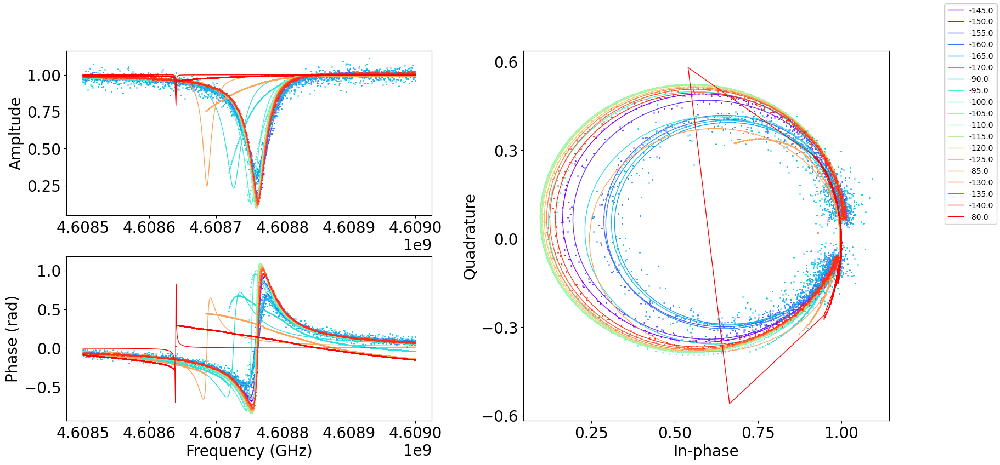

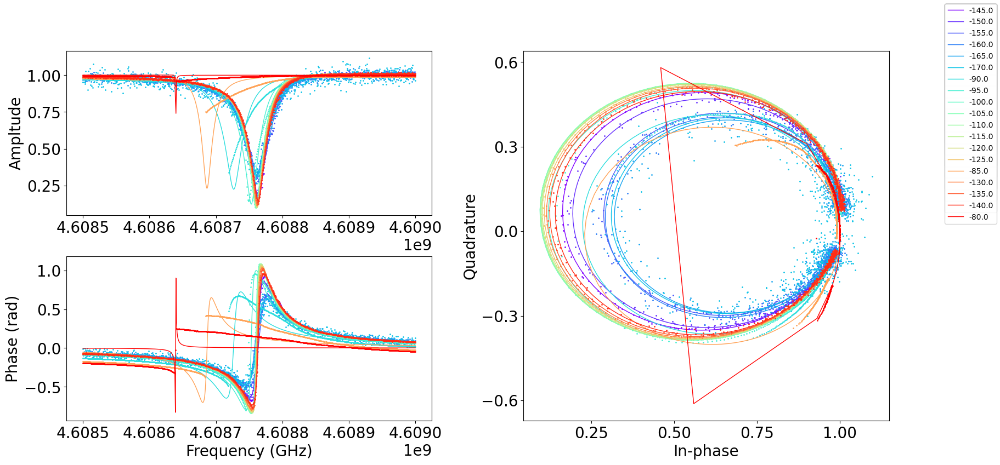

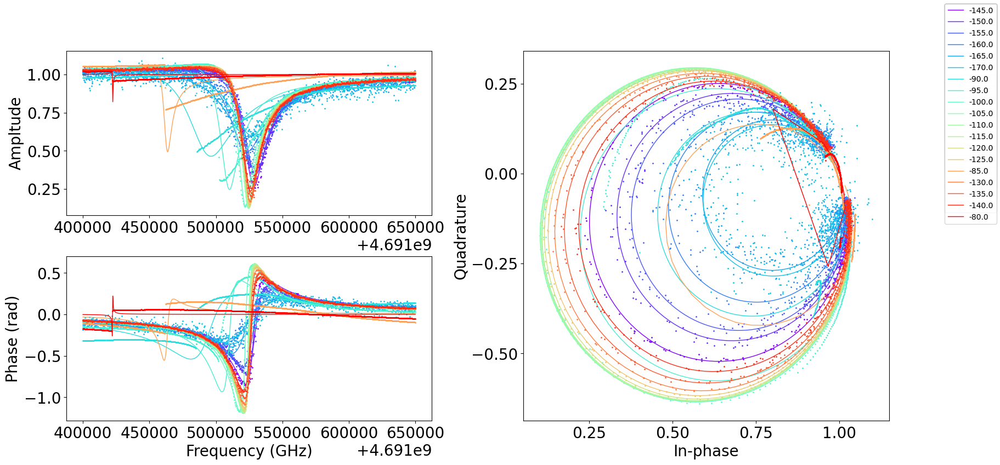

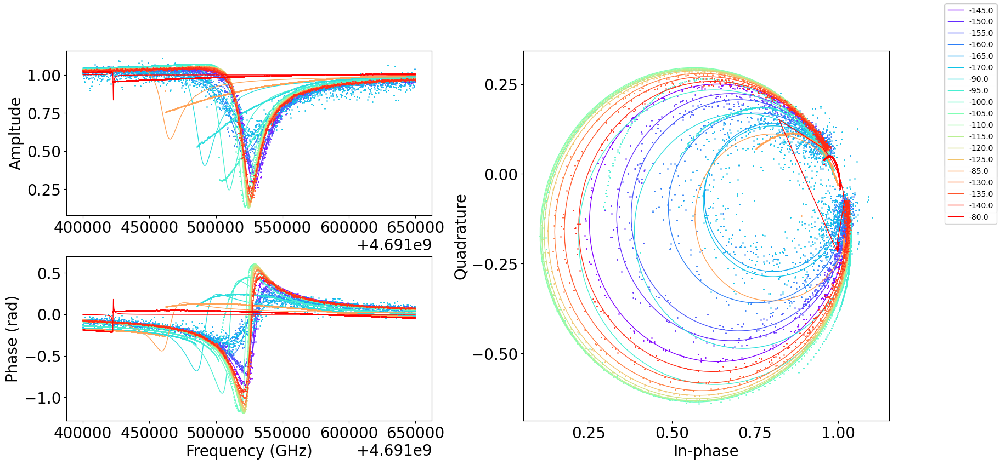

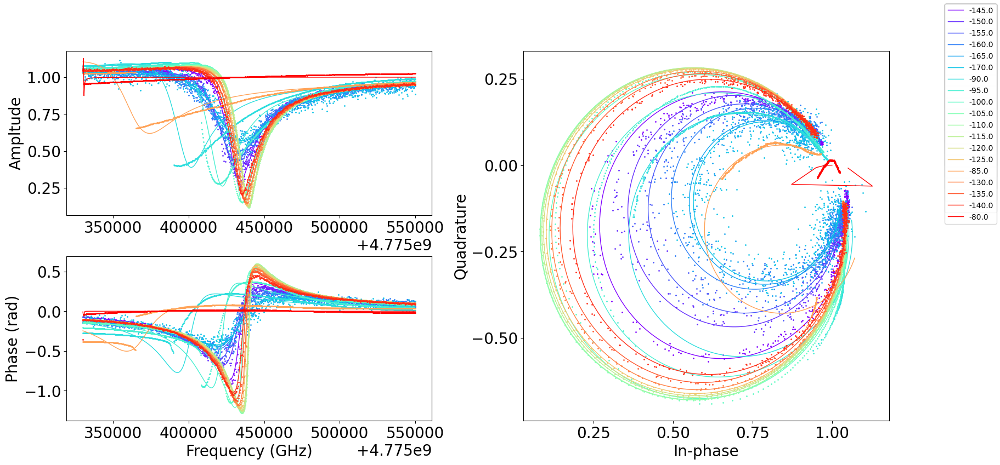

...

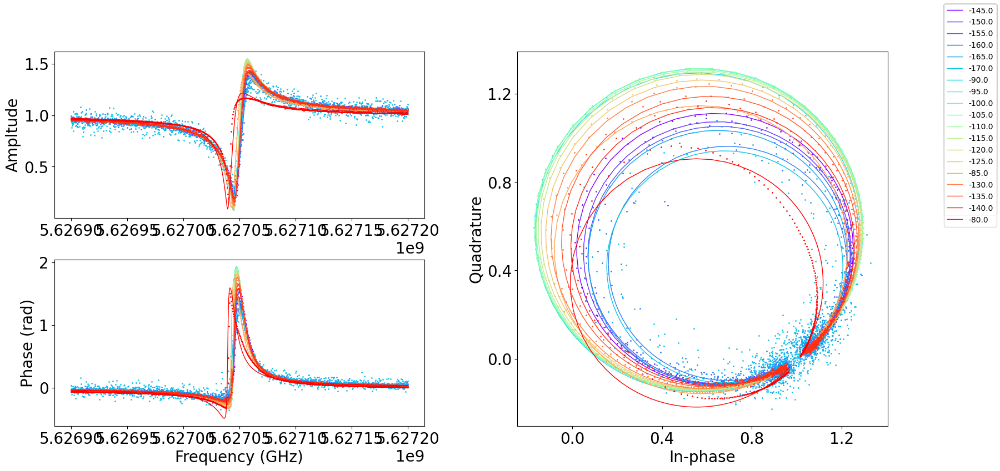

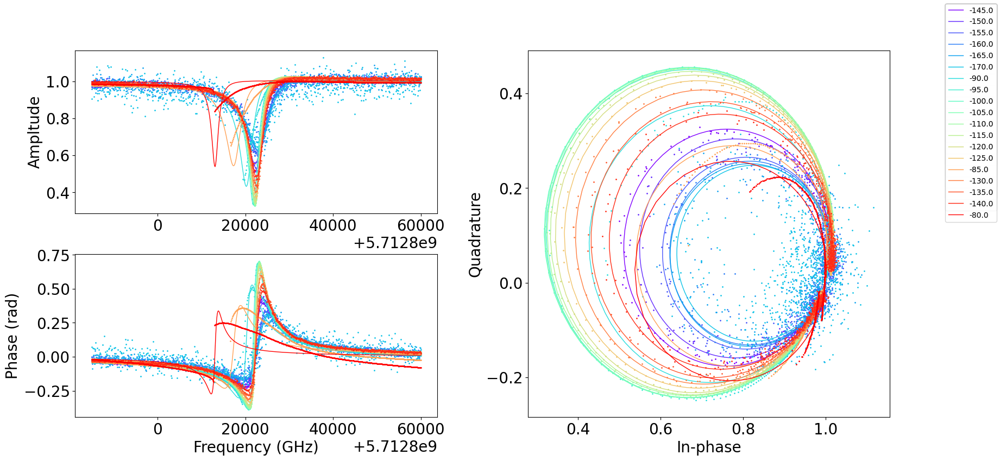

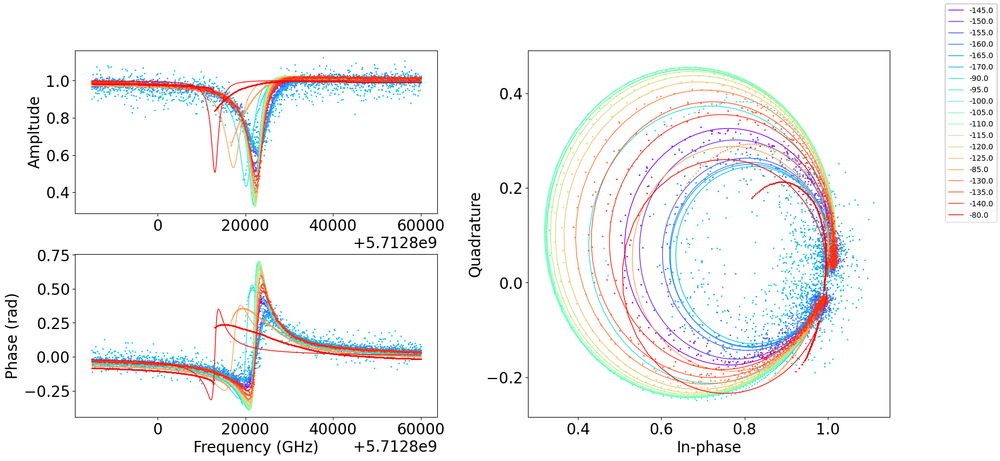

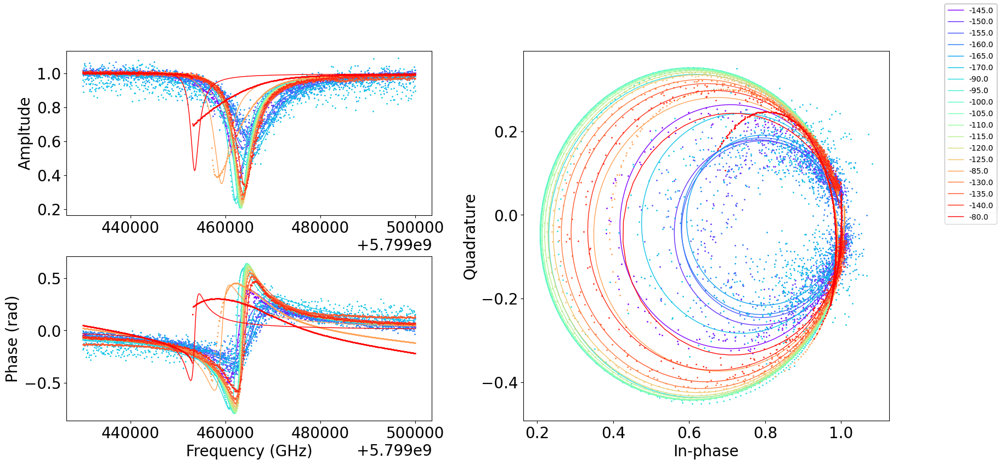

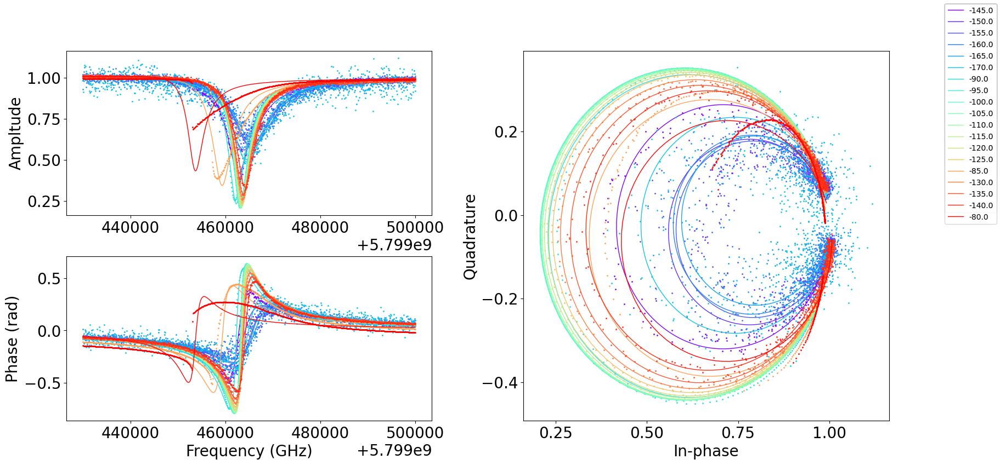

In [4]:
from qcat.analysis.resonator.photon_dep.res_data import *
from qcat.utility.file_structure import check_file_extension, create_subfolder


raw_data_fd = r"C:\Users\ASUS\Documents\python training\AS1203\prepocess"
output_fd = r"C:\Users\ASUS\Documents\python training\AS1203\result"
# Get all resonator from folder
resonator_list = [d for d in os.listdir(raw_data_fd) if os.path.isdir(os.path.join(raw_data_fd, d))]

# check_configure(f"{output_fd}", ["power_dep_fit"])

all_resonator_result = []

for resonator_label in resonator_list:
    print(f"Processing {resonator_label}")

    create_subfolder(output_fd,resonator_label)
    result_folder = f"{output_fd}\\{resonator_label}"

    resonator_data_folder = f"{raw_data_fd}\\{resonator_label}"
    resonator = PhotonDepResonator(resonator_label)
    # Find cavity data (nc file) in the folder
    file_list = check_file_extension( resonator_data_folder, "nc")
    print(resonator_data_folder)

    for f_name in file_list:
        dataset = xr.open_dataset(f"{resonator_data_folder}\\{f_name}")
        power = dataset.attrs["power"]
        attenuation = dataset.attrs["attenuation"]
        frequency = dataset.coords["frequency"].values
        data = dataset["s21"].values
        resonator.import_array(frequency, data[0]+1j*data[1], power-attenuation)
    result = resonator.refined_analysis( result_folder )
    # result = resonator.free_analysis( result_folder )

    all_resonator_result.append( result )
    
    df_results = pd.concat(all_resonator_result)
    df_results.Name = resonator_label



Plot

In [5]:
plot_data_fd = r"C:\Users\ASUS\Documents\python training\AS1203\result"
output_fd = r"C:\Users\ASUS\Documents\python training\AS1203\result"
from qcat.visualization.photon_dep_loss import * 
all_resonator_result = []
folder_list = [d for d in os.listdir(raw_data_fd) if os.path.isdir(os.path.join(raw_data_fd, d))]

fr = []
qc = []
for resonator_label in folder_list:
    create_subfolder(output_fd,resonator_label)
    result_folder = f"{output_fd}\\{resonator_label}"

    # Plotting
    df_powerQ_free = pd.read_csv( f"{plot_data_fd}\\{resonator_label}\\free_result.csv" )
    plot_singleRes_powerQ_free(df_powerQ_free, cav_label=f"{resonator_label}", output_fd=result_folder)
    plot_singleRes_powerloss_free(df_powerQ_free, cav_label=f"{resonator_label}", output_fd=result_folder)

    df_powerQ_refined = pd.read_csv( f"{plot_data_fd}\\{resonator_label}\\refined_result.csv" )
    plot_singleRes_powerQ_refined(df_powerQ_refined, cav_label=f"{resonator_label}", output_fd=result_folder)
    plot_singleRes_powerloss_refined(df_powerQ_refined, cav_label=f"{resonator_label}", output_fd=result_folder)
    fr.append(df_powerQ_refined["fr"].values[-1])
    qc.append(df_powerQ_refined["Qc_dia_corr_fixed"].values[-1])



c:\users\asus\documents\github\qcat\src\qcat\visualization\photon_dep_loss.py:615: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axObj.legend()
c:\users\asus\documents\github\qcat\src\qcat\visualization\photon_dep_loss.py:615: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axObj.legend()
c:\users\asus\documents\github\qcat\src\qcat\visualization\photon_dep_loss.py:615: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axObj.legend()
c:\users\asus\documents\github\qcat\src\qcat\visualization\photon_dep_loss.py:615: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an un

In [1]:
## After assignment each cavity, get foward analysis
import pandas as pd
assignment = pd.read_json(r"C:\Users\ASUS\Documents\python training\coil\result\assignment.json")
plot_multiRes_powerQ_free( output_fd, assignment, output_fd)
plot_multiRes_powerQ_refined( output_fd, assignment, output_fd, ((1e-2,1e6),(1e5,1e7)) )
# ((3e-1,3e5),(1e5,5e6))
pd.DataFrame({"fr":np.array(fr),"Qc":np.array(qc)}).to_csv( f"{output_fd}/Qc.csv" )

NameError: name 'plot_multiRes_powerQ_free' is not defined

: 